In [2]:
!pip install stable_baselines3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 187.2/187.2 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-c

In [3]:
import pandas as pd
import polars as pl
import pyarrow as pa
import gymnasium as gym
from gymnasium import spaces
import yfinance as yf
from stable_baselines3 import PPO
import numpy as np
import matplotlib.pyplot as plt

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


##**Business Understanding**

The objective of this problem statement is to train a reinforcement learning agent to learn how to buy and trade stocks to optimize portfolio returns. By using reinforcement learning, the agent can identify optimal trading actions based on historical stock market data and maximize portfolio value, while considering risk and transaction cost.

In [5]:
class PPOTradingWrapper():
    def __init__(self, window: int = 20):
        self.window = window
        self.required_columns = ["open", "high", "low", "close", "volume"]
        self.ppo_model = None

    def load_context(self, context):
        from stable_baselines3 import PPO
        self.ppo_model = PPO.load(context.artifacts["ppo_model_path"])

    def _prepare_observation(self, data_window):
        if isinstance(data_window, pd.DataFrame):
            df_window = data_window[self.required_columns]
        else:
            df_window = pd.DataFrame(data_window, columns=self.required_columns)
        price_data = df_window.to_numpy(dtype=np.float32).flatten()
        obs = np.concatenate([
            price_data,
            np.array([1_000_000.0, 0.0], dtype=np.float32)
        ])
        return obs
    def predict(self, context, model_input):
        try:
            recent_data = model_input.tail(self.window)
            obs = self._prepare_observation(recent_data)

            action, _ = self.ppo_model.predict(obs, deterministic=True)
            if isinstance(action, np.ndarray):
                action = int(action.item())
            else:
                action = int(action)

            signal_map = {0: "HOLD", 1: "BUY", 2: "SELL"}
            return {"action": action,
                    "signal": signal_map[action]}

        except Exception as e:
            #print(f"Prediction error: {e}")
            raise RuntimeError(f"Prediction error: {e}")

##**Reinforcement Learning Environment**

In [6]:
class SingleStockTradingEnv(gym.Env):
    """
    Simple one‑stock trading env for Gymnasium + Stable‑Baselines3.
    Action: 0=hold, 1=buy all‑in, 2=sell all‑out.
    """

    metadata = {"render_modes": ["human"]}

    def __init__(self, df: pd.DataFrame, window: int = 10,
                 init_cash: float = 1_000_000, fee: float = 1e-3):
        super().__init__()
        self.df        = df.reset_index(drop=True) # stock data
        self.window    = window # look back window
        self.init_cash = init_cash # starting cash
        self.fee       = fee # transaction fee

        self.action_space = spaces.Discrete(3) # actions: hold, sell, buy
        obs_len = window * 5 + 2
        self.observation_space = spaces.Box(-np.inf, np.inf,
                                            shape=(obs_len,), dtype=np.float32)

    # ---------- Gymnasium API ----------
    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.t       = np.random.randint(self.window, len(self.df) - 200)
        self.cash    = float(self.init_cash)
        self.shares  = 0.0
        self._update_state()
        pv0 = self.cash  # no shares yet
        info = {"portfolio_value": pv0}
        return self.state.copy(), info

    def step(self, action: int):
    # buy: convert all cash to shares
    # sell: convert all shares to cash
    # hold: do nothing
        price = float(self.df.loc[self.t, "close"])


        reward = 0.0
        if action == 1 and self.shares == 0.0:              # BUY
            self.shares = self.cash / price
            self.cash   = 0.0
            reward     -= self.fee
        elif action == 2 and self.shares > 0.0:             # SELL
            self.cash   = self.shares * price
            self.shares = 0.0
            reward     -= self.fee

        # increment time
        self.t += 1
        terminated = self.t >= len(self.df) - 1
        truncated  = False

        # reward causes change in portfolio value
        pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
        pv_prev = self.cash + self.shares * price
        reward += pv_now - pv_prev

        self._update_state()
        info = {"portfolio_value": pv_now}
        return self.state.copy(), reward, terminated, truncated, info


    def _update_state(self):
        window_df = self.df.iloc[self.t - self.window : self.t]
        prices = window_df[["open","high","low","close","volume"]].values.flatten()
        self.state = np.concatenate(
            [prices,
             np.array([self.cash],  dtype=np.float32),
             np.array([self.shares], dtype=np.float32)]
        ).astype(np.float32)

    # optional
    def render(self):
        pv = self.cash + self.shares * float(self.df.loc[self.t, "close"])
        print(f"t={self.t:4d} | cash={self.cash:,.0f} | shares={self.shares:.2f} | PV={pv:,.0f}")

##**Data Acquisition**

The historical stock market data comes from Yahoo Finance. The data acquisition is handled by data processor modules from a GitHub repository. These data processor modules download and properly format the raw data for use in a reinforcement learning environment.

##**Agent Training**

In [7]:
# stock data from Yahoo Finance
df = yf.download("AAPL", start="2015-01-01", end="2020-12-31", auto_adjust=True).reset_index()
df = df.rename(columns=str.lower)

# train/test split
split_date = "2019-01-01"
train_df = df[df["date"] < split_date]
test_df = df[df["date"] >= split_date]

# initialize RL environment with training data
base_env = SingleStockTradingEnv(df, window=20)
env = gym.wrappers.TimeLimit(base_env, max_episode_steps=len(df)-21)

# PPO model
model = PPO("MlpPolicy", env, verbose=1)
# train model for 50,000 steps
model.learn(total_timesteps=50_000)

[*********************100%***********************]  1 of 1 completed


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1.13e+03 |
|    ep_rew_mean     | 1.13e+06 |
| time/              |          |
|    fps             | 294      |
|    iterations      | 1        |
|    time_elapsed    | 6        |
|    total_timesteps | 2048     |
---------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 701           |
|    ep_rew_mean          | 8.59e+05      |
| time/                   |               |
|    fps                  | 269           |
|    iterations           | 2             |
|    time_elapsed         | 15            |
|    total_timesteps      | 4096          |
| train/                  |               |
|    approx_kl            | 7.5223536e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 5.96e-08      |
|    learning_rate        | 0.0003        |
|    loss                 | 2.54e+09      |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.000278     |
|    value_loss           | 4.11e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 827           |
|    ep_rew_mean          | 9.35e+05      |
| time/                   |               |
|    fps                  | 260           |
|    iterations           | 3             |
|    time_elapsed         | 23            |
|    total_timesteps      | 6144          |
| train/                  |               |
|    approx_kl            | 1.5133031e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 1.61e-06      |
|    learning_rate        | 0.0003        |
|    loss                 | 1.99e+09      |
|    n_updates            | 20            |
|    policy_gradient_loss | -0.000128     |
|    value_loss           | 3.2e+09       |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 852          |
|    ep_rew_mean          | 8.64e+05     |
| time/                   |              |
|    fps                  | 254          |
|    iterations           | 4            |
|    time_elapsed         | 32           |
|    total_timesteps      | 8192         |
| train/                  |              |
|    approx_kl            | 1.874863e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 5.36e-07     |
|    learning_rate        | 0.0003       |
|    loss                 | 2.13e+09     |
|    n_updates            | 30           |
|    policy_gradient_loss | -0.000107    |
|    value_loss           | 4.41e+09     |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 788           |
|    ep_rew_mean          | 9.78e+05      |
| time/                   |               |
|    fps                  | 254           |
|    iterations           | 5             |
|    time_elapsed         | 40            |
|    total_timesteps      | 10240         |
| train/                  |               |
|    approx_kl            | 0.00058739935 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 3.58e-07      |
|    learning_rate        | 0.0003        |
|    loss                 | 9.03e+08      |
|    n_updates            | 40            |
|    policy_gradient_loss | -0.000844     |
|    value_loss           | 3.02e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 762           |
|    ep_rew_mean          | 9.49e+05      |
| time/                   |               |
|    fps                  | 250           |
|    iterations           | 6             |
|    time_elapsed         | 49            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 2.0261563e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 4.77e-07      |
|    learning_rate        | 0.0003        |
|    loss                 | 4e+09         |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000177     |
|    value_loss           | 6.59e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 762           |
|    ep_rew_mean          | 9.93e+05      |
| time/                   |               |
|    fps                  | 248           |
|    iterations           | 7             |
|    time_elapsed         | 57            |
|    total_timesteps      | 14336         |
| train/                  |               |
|    approx_kl            | 5.6723948e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 4.77e-07      |
|    learning_rate        | 0.0003        |
|    loss                 | 1.56e+09      |
|    n_updates            | 60            |
|    policy_gradient_loss | -0.000285     |
|    value_loss           | 4.27e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 776          |
|    ep_rew_mean          | 9.92e+05     |
| time/                   |              |
|    fps                  | 248          |
|    iterations           | 8            |
|    time_elapsed         | 65           |
|    total_timesteps      | 16384        |
| train/                  |              |
|    approx_kl            | 4.792612e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 8.34e-07     |
|    learning_rate        | 0.0003       |
|    loss                 | 2.34e+09     |
|    n_updates            | 70           |
|    policy_gradient_loss | -0.000282    |
|    value_loss           | 4.02e+09     |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 790          |
|    ep_rew_mean          | 9.39e+05     |
| time/                   |              |
|    fps                  | 245          |
|    iterations           | 9            |
|    time_elapsed         | 74           |
|    total_timesteps      | 18432        |
| train/                  |              |
|    approx_kl            | 5.927286e-06 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 5.36e-07     |
|    learning_rate        | 0.0003       |
|    loss                 | 1.74e+09     |
|    n_updates            | 80           |
|    policy_gradient_loss | -2.7e-05     |
|    value_loss           | 5.09e+09     |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 765          |
|    ep_rew_mean          | 9.06e+05     |
| time/                   |              |
|    fps                  | 245          |
|    iterations           | 10           |
|    time_elapsed         | 83           |
|    total_timesteps      | 20480        |
| train/                  |              |
|    approx_kl            | 0.0004940919 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 1.07e-06     |
|    learning_rate        | 0.0003       |
|    loss                 | 1.12e+09     |
|    n_updates            | 90           |
|    policy_gradient_loss | -0.000274    |
|    value_loss           | 1.64e+09     |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 772          |
|    ep_rew_mean          | 9.1e+05      |
| time/                   |              |
|    fps                  | 242          |
|    iterations           | 11           |
|    time_elapsed         | 93           |
|    total_timesteps      | 22528        |
| train/                  |              |
|    approx_kl            | 2.087414e-06 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 2.38e-06     |
|    learning_rate        | 0.0003       |
|    loss                 | 1.42e+09     |
|    n_updates            | 100          |
|    policy_gradient_loss | -3.29e-05    |
|    value_loss           | 3.39e+09     |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 794           |
|    ep_rew_mean          | 9.19e+05      |
| time/                   |               |
|    fps                  | 239           |
|    iterations           | 12            |
|    time_elapsed         | 102           |
|    total_timesteps      | 24576         |
| train/                  |               |
|    approx_kl            | 1.7205864e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 1.79e-06      |
|    learning_rate        | 0.0003        |
|    loss                 | 2.39e+09      |
|    n_updates            | 110           |
|    policy_gradient_loss | -8.85e-05     |
|    value_loss           | 4.55e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 755          |
|    ep_rew_mean          | 8.5e+05      |
| time/                   |              |
|    fps                  | 240          |
|    iterations           | 13           |
|    time_elapsed         | 110          |
|    total_timesteps      | 26624        |
| train/                  |              |
|    approx_kl            | 6.663738e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 6.56e-06     |
|    learning_rate        | 0.0003       |
|    loss                 | 2.17e+09     |
|    n_updates            | 120          |
|    policy_gradient_loss | -0.000272    |
|    value_loss           | 3.14e+09     |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 762           |
|    ep_rew_mean          | 8.59e+05      |
| time/                   |               |
|    fps                  | 238           |
|    iterations           | 14            |
|    time_elapsed         | 120           |
|    total_timesteps      | 28672         |
| train/                  |               |
|    approx_kl            | 0.00014098859 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 4.95e-06      |
|    learning_rate        | 0.0003        |
|    loss                 | 1.15e+09      |
|    n_updates            | 130           |
|    policy_gradient_loss | -0.000476     |
|    value_loss           | 2.83e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 776          |
|    ep_rew_mean          | 8.71e+05     |
| time/                   |              |
|    fps                  | 236          |
|    iterations           | 15           |
|    time_elapsed         | 130          |
|    total_timesteps      | 30720        |
| train/                  |              |
|    approx_kl            | 3.404112e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 5.9e-06      |
|    learning_rate        | 0.0003       |
|    loss                 | 1.32e+09     |
|    n_updates            | 140          |
|    policy_gradient_loss | -0.000173    |
|    value_loss           | 3.49e+09     |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 764           |
|    ep_rew_mean          | 8.53e+05      |
| time/                   |               |
|    fps                  | 235           |
|    iterations           | 16            |
|    time_elapsed         | 139           |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 5.5551325e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 6.5e-06       |
|    learning_rate        | 0.0003        |
|    loss                 | 2.71e+09      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.00025      |
|    value_loss           | 4.9e+09       |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 778           |
|    ep_rew_mean          | 8.83e+05      |
| time/                   |               |
|    fps                  | 232           |
|    iterations           | 17            |
|    time_elapsed         | 149           |
|    total_timesteps      | 34816         |
| train/                  |               |
|    approx_kl            | 2.0202337e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 1.1e-05       |
|    learning_rate        | 0.0003        |
|    loss                 | 1.92e+09      |
|    n_updates            | 160           |
|    policy_gradient_loss | -7.81e-05     |
|    value_loss           | 2.48e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 767           |
|    ep_rew_mean          | 9.03e+05      |
| time/                   |               |
|    fps                  | 231           |
|    iterations           | 18            |
|    time_elapsed         | 159           |
|    total_timesteps      | 36864         |
| train/                  |               |
|    approx_kl            | 1.1301076e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 9.48e-06      |
|    learning_rate        | 0.0003        |
|    loss                 | 3.57e+09      |
|    n_updates            | 170           |
|    policy_gradient_loss | -0.000101     |
|    value_loss           | 5.66e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 778           |
|    ep_rew_mean          | 9.06e+05      |
| time/                   |               |
|    fps                  | 229           |
|    iterations           | 19            |
|    time_elapsed         | 169           |
|    total_timesteps      | 38912         |
| train/                  |               |
|    approx_kl            | 2.5824062e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 4.17e-06      |
|    learning_rate        | 0.0003        |
|    loss                 | 2.87e+09      |
|    n_updates            | 180           |
|    policy_gradient_loss | -0.000196     |
|    value_loss           | 6.19e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 752          |
|    ep_rew_mean          | 8.94e+05     |
| time/                   |              |
|    fps                  | 227          |
|    iterations           | 20           |
|    time_elapsed         | 179          |
|    total_timesteps      | 40960        |
| train/                  |              |
|    approx_kl            | 9.296811e-06 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 7.75e-06     |
|    learning_rate        | 0.0003       |
|    loss                 | 2.43e+09     |
|    n_updates            | 190          |
|    policy_gradient_loss | -6.94e-05    |
|    value_loss           | 3.33e+09     |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

--------------------------------------------
| rollout/                |                |
|    ep_len_mean          | 747            |
|    ep_rew_mean          | 9.04e+05       |
| time/                   |                |
|    fps                  | 226            |
|    iterations           | 21             |
|    time_elapsed         | 190            |
|    total_timesteps      | 43008          |
| train/                  |                |
|    approx_kl            | 0.000107413594 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.1           |
|    explained_variance   | 1.41e-05       |
|    learning_rate        | 0.0003         |
|    loss                 | 1.7e+09        |
|    n_updates            | 200            |
|    policy_gradient_loss | -0.000584      |
|    value_loss           | 3.16e+09       |
--------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 756          |
|    ep_rew_mean          | 9.24e+05     |
| time/                   |              |
|    fps                  | 223          |
|    iterations           | 22           |
|    time_elapsed         | 201          |
|    total_timesteps      | 45056        |
| train/                  |              |
|    approx_kl            | 5.099515e-06 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.1         |
|    explained_variance   | 1.11e-05     |
|    learning_rate        | 0.0003       |
|    loss                 | 3.3e+09      |
|    n_updates            | 210          |
|    policy_gradient_loss | -5.69e-05    |
|    value_loss           | 5.5e+09      |
------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 746           |
|    ep_rew_mean          | 9.11e+05      |
| time/                   |               |
|    fps                  | 222           |
|    iterations           | 23            |
|    time_elapsed         | 211           |
|    total_timesteps      | 47104         |
| train/                  |               |
|    approx_kl            | 3.5871868e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 1.44e-05      |
|    learning_rate        | 0.0003        |
|    loss                 | 1.54e+09      |
|    n_updates            | 220           |
|    policy_gradient_loss | -0.000174     |
|    value_loss           | 2.79e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 756           |
|    ep_rew_mean          | 9.1e+05       |
| time/                   |               |
|    fps                  | 221           |
|    iterations           | 24            |
|    time_elapsed         | 222           |
|    total_timesteps      | 49152         |
| train/                  |               |
|    approx_kl            | 2.0351756e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 1.54e-05      |
|    learning_rate        | 0.0003        |
|    loss                 | 1.54e+09      |
|    n_updates            | 230           |
|    policy_gradient_loss | -0.000117     |
|    value_loss           | 4.18e+09      |
-------------------------------------------


Streaming output truncated to the last 5000 lines.
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t,

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 765           |
|    ep_rew_mean          | 9.11e+05      |
| time/                   |               |
|    fps                  | 219           |
|    iterations           | 25            |
|    time_elapsed         | 233           |
|    total_timesteps      | 51200         |
| train/                  |               |
|    approx_kl            | 4.2326516e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.1          |
|    explained_variance   | 1.77e-05      |
|    learning_rate        | 0.0003        |
|    loss                 | 1.98e+09      |
|    n_updates            | 240           |
|    policy_gradient_loss | -0.000241     |
|    value_loss           | 5.31e+09      |
-------------------------------------------


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

##**Model Evaluation**

In [8]:
# evaluate model on test data
test_env = gym.wrappers.TimeLimit(SingleStockTradingEnv(test_df, window=20), max_episode_steps=len(test_df)-21)

/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 1: Total Reward = 1851216.20


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 2: Total Reward = 808033.14


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 3: Total Reward = 1299502.08


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 4: Total Reward = 839131.20


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 5: Total Reward = 1175264.79


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 6: Total Reward = 1497087.56


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 7: Total Reward = 2047605.65


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 8: Total Reward = 1451829.88


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 9: Total Reward = 1662360.50


/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  price = float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:56: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  pv_now  = self.cash + self.shares * float(self.df.loc[self.t, "close"])
/tmp/ipython-input-3433197301.py:37: Fut

Episode 10: Total Reward = 663129.11


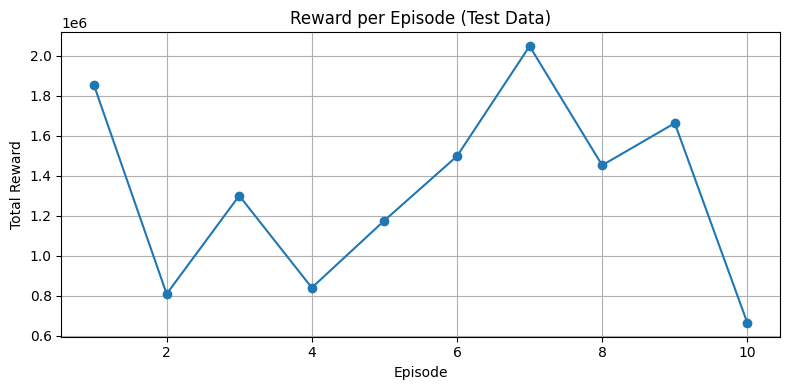

In [9]:
num_episodes = 10
episode_rewards = []
all_pv = []

for ep in range(num_episodes):
    obs, info = test_env.reset()
    total_reward = 0
    pv = [info["portfolio_value"]]
    done = False

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, terminated, truncated, info = test_env.step(action)
        done = terminated or truncated
        total_reward += reward
        pv.append(info["portfolio_value"])

    episode_rewards.append(total_reward)
    all_pv.append(pv)
    print(f"Episode {ep+1}: Total Reward = {total_reward:.2f}")

# reward per episode curve
plt.figure(figsize=(8, 4))
plt.plot(range(1, num_episodes + 1), episode_rewards, marker='o')
plt.title("Reward per Episode (Test Data)")
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.grid(True)
plt.tight_layout()
plt.savefig("reward_curve.png")
plt.show()

In [10]:
# calculate Sharpe ratio
portfolio = pd.Series(all_pv[-1], name="PV")
rets = portfolio.pct_change().dropna()
sharpe = np.sqrt(252) * rets.mean() / rets.std()
print(f"Sharpe ratio: {sharpe:.2f}") # measures risk-adjusted return

Sharpe ratio: 1.44


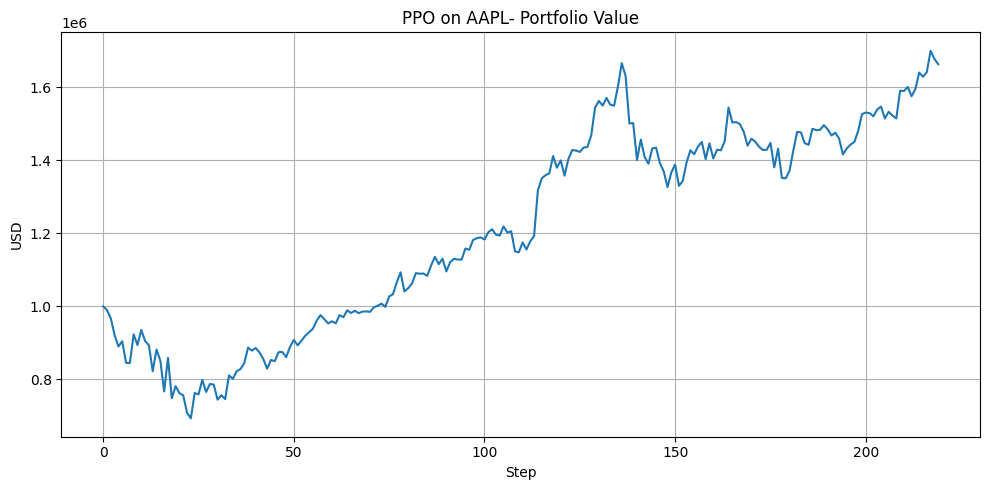

In [11]:
# portfolio value over time
plt.figure(figsize=(10, 5))
plt.plot(portfolio.values)
plt.title("PPO on AAPL- Portfolio Value")
plt.xlabel("Step")
plt.ylabel("USD")
plt.grid(True)
plt.tight_layout()
plt.savefig("ppo_portfolio.png")
plt.show()

##**Monitoring & Maintenance**

The reinforcement learning model was logged using MLflow to track model performance across experiment runs and make predictions based on previous steps. The end-to-end project was also wrapped in a pipeline structure and saved as a pickle file in MLflow. This part of the project was removed to streamline the workflow and focus on direct model evaluation. Pipeline storage was not essential for the final deployment of the project.